In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML, Image
%matplotlib inline
plt.style.use('seaborn-white')# Create animation

In [72]:
def LossComp(x,y):
    loss = 2*x**2 + y**2 # enter loss function
    grad = [4*x,2*y] # enter its gradient
    return loss,grad

def NesterovGrad(x1,y1,alpha1,alpha2,delta): # delta = error_tolerance
    theta_0 = []
    theta_1 = []
    l = []

    lamb_prev = 1
    wx_prev = x1
    wy_prev = y1
    Loss,Grad = LossComp(x1,y1)
    theta_0.append(x1)
    theta_1.append(y1)
    l.append(Loss)

    while Loss > delta:
    
        xt = theta_0[-1]
        yt = theta_1[-1]
    
#       Nesterov gradient update
        wxt = xt - alpha1*Grad[0]
        wyt = yt - alpha2*Grad[1]
    
        lamb = (1 + np.sqrt(1 + 4*lamb_prev*lamb_prev))/2  
        gamma = ((1 - lamb_prev)/lamb)
    
        xt = (1-gamma)*wxt + gamma*wx_prev
        yt = (1-gamma)*wyt + gamma*wy_prev 
    
        wx_prev = wxt
        wy_prev = wyt
        lamb_prev = lamb
    
        theta_0.append(xt)
        theta_1.append(yt)
    
        Loss,Grad = LossComp(xt,yt)
        l.append(Loss)
        
    return l,theta_0,theta_1


def NormalGrad(x1,y1,alpha1,alpha2,delta):
    theta_0 = []
    theta_1 = []
    l = []

    lamb_prev = 1
    Loss,Grad = LossComp(x1,y1)
    theta_0.append(x1)
    theta_1.append(y1)
    l.append(Loss)

    while Loss > delta:
    
        xt = theta_0[-1]
        yt = theta_1[-1]
        
#       Normal Gradient decent update  
        xt = xt - alpha1*Grad[0]
        yt = yt - alpha2*Grad[1]
    
        theta_0.append(xt)
        theta_1.append(yt)
    
        Loss,Grad = LossComp(xt,yt)
        l.append(Loss)
        
    return l,theta_0,theta_1

l,theta_0,theta_1 = NesterovGrad(5,5,0.25,0.1,1e-10)


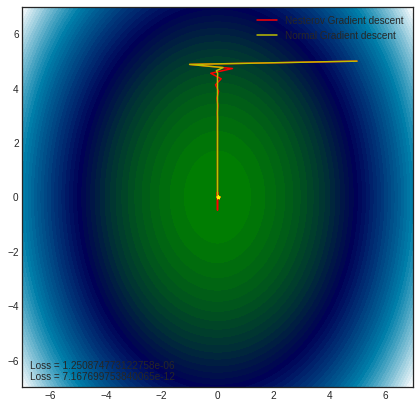

In [73]:
t1 = 2
t2 = 1
fig1, ax1 = plt.subplots(figsize = (7,7))
x, y = np.meshgrid(np.linspace(-7,7,100),np.linspace(-7,7,100))
z = (t1*x**2 + t2*y**2)
ax1.contourf(np.linspace(-7,7,100),np.linspace(-7,7,100),z,50,cmap = 'ocean')

line1, = ax1.plot([], [], 'r', label = 'Nesterov Gradient descent', lw = 1.5)
line2, = ax1.plot([], [], 'y', label = 'Normal Gradient descent', lw = 1.5)
line = [line1,line2]

point1, = ax1.plot([], [], '*', color = 'red', markersize = 4)
point2, = ax1.plot([], [], '*', color = 'yellow', markersize = 4)
point = [point1,point2]

value_display1 = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)
value_display2 = ax1.text(0.02, 0.05, '', transform=ax1.transAxes)
value_display = [value_display1,value_display2]

l1,tn0,tn1 = NesterovGrad(5,5,0.3,0.012,1e-10)
l2,t0,t1 = NormalGrad(5,5,0.3,0.012,1e-10) 

theta_0 = [tn0,t0]
theta_1 = [tn1,t1]
l = [l1,l2]

def init_1():
    
    for l in line:
        l.set_data([],[])
    for p in point:    
        p.set_data([],[])
    for v in value_display:
        v.set_text('')

    return line[0],line[1],point[0],point[1],value_display[0],value_display[1]

def animate_1(i):
    # Animate line
    for j in range(2):
        line[j].set_data(theta_0[j][:i], theta_1[j][:i])
        point[j].set_data(theta_0[j][i], theta_1[j][i])
        value_display[j].set_text('Loss = ' + str(l[j][i]))

    return line[0],line[1],point[0],point[1],value_display[0],value_display[1]

ax1.legend(loc = 1)

anim1 = animation.FuncAnimation(fig1, animate_1, init_func=init_1,
                               frames=len(theta_0[0]), interval=100, 
                               repeat_delay=60, blit=True)

HTML(anim1.to_jshtml())